<a href="https://colab.research.google.com/github/bobergsatoko/generativeAI/blob/main/Multimodal_Generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/openai/CLIP.git

!git clone https://github.com/CompVis/taming-transformers


Cloning into 'CLIP'...
remote: Enumerating objects: 236, done.
remote: Total 236 (delta 0), reused 0 (delta 0), pack-reused 236
Receiving objects: 100% (236/236), 8.92 MiB | 9.19 MiB/s, done.
Resolving deltas: 100% (122/122), done.
Cloning into 'taming-transformers'...
remote: Enumerating objects: 1335, done.
remote: Total 1335 (delta 0), reused 0 (delta 0), pack-reused 1335
Receiving objects: 100% (1335/1335), 409.77 MiB | 16.29 MiB/s, done.
Resolving deltas: 100% (278/278), done.


In [ ]:
# install some extra libraries
!pip install --no-deps ftfy regex tqdm
!pip install omegaconf==2.0.0 pytorch-lightning==1.0.8
!pip uninstall torchtext --yes
!pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# import libraries
import numpy as np
import torch, os, imageio, pdb, math
import torchvision
import torchvision.transforms as T
import torchvision.transforms.functional as TF

import PIL
import matplotlib.pyplot as plt

import yaml
from omegaconf import OmegaConf

from CLIP import clip

#import warnings
#warnings.filterwarnings('ignore')

In [ ]:
# helper functions
def show_from_tensor(tensor):
  img = tensor.clone()
  img = img.mul(255).byte() # originally is from 0-1
  img = img.cpu().numpy().transpose((1, 2, 0)) # pytorch switches channels compared to imshow

  plt.figure(figsize=(10, 7))
  plt.axis('off')
  plt.imshow(img)
  plt.show()

def norm_data(data):
  return (data.clip(-1, 1) + 1) / 2 # range between 0 and 1 in the result

# Parameters
learning_rate = .5
batch_size = 1
wd = .1
noise_factor = .22

total_iter = 400
im_shape = [650, 650, 3] # height, width, channel
size1, size2, channels = im_shape

In [ ]:
# Clip model
clipmodel, _ = clip.load('ViT-B/32', jit=False)
clipmodel.eval() # clip is already trained
print(clip.available_models())

print("Clip model visual input resolution: ", clipmodel.visual.input_resolution)

device=torch.device("cuda:0")
torch.cuda.empty_cache()


['RN50', 'RN101', 'RN50x4', 'RN50x16', 'RN50x64', 'ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']
Clip model visual input resolution:  224


In [ ]:
## taming transformer instantiation
%cd taming-transformers/
!mkdir -p models/vqgan_imagenet_f16_16384/checkpoints
!mkdir -p models/vqgan_imagenet_f16_16384/configs

if len(os.listdir('models/vqgan_imagenet_f16_16384/checkpoints')) == 0:
  !wget 'https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1' -O 'models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt'
  !wget 'https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1' -O 'models/vqgan_imagenet_f16_16384/configs/model.yaml'

/content/taming-transformers/taming-transformers
--2022-10-18 20:42:48--  https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1
Resolving heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)... 129.206.7.113
Connecting to heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)|129.206.7.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://heibox.uni-heidelberg.de/seafhttp/files/a07653a0-f98f-448a-bdd3-e4c14f6b586b/last.ckpt [following]
--2022-10-18 20:42:49--  https://heibox.uni-heidelberg.de/seafhttp/files/a07653a0-f98f-448a-bdd3-e4c14f6b586b/last.ckpt
Reusing existing connection to heibox.uni-heidelberg.de:443.
HTTP request sent, awaiting response... 200 OK
Length: 980092370 (935M) [application/octet-stream]
Saving to: ‘models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt’

models/vqgan_imagen 100%[===================>] 934.69M  17.0MB/s    in 63s     

2022-10-18 20:43:52 (14.9 MB/s) - ‘models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt’ 

In [ ]:
from taming.models.vqgan import VQModel

def load_config(config_path, display=False):
  config_data = OmegaConf.load(config_path)
  if display:
    print(yaml.dump(OmegaConf.to_container(config_data)))
  return config_data

def load_vqgan(config, chk_path=None):
  model = VQModel(**config.model.params)
  if chk_path is not None:
    state_dict = torch.load(chk_path, map_location="cpu")["state_dict"]
    missing, unexpected = model.load_state_dict(state_dict, strict=False)
  return model.eval()

def generator(x):
  x = taming_model.post_quant_conv(x)
  x = taming_model.decoder(x)
  return x

taming_config = load_config("./models/vqgan_imagenet_f16_16384/configs/model.yaml", display=True)
taming_model = load_vqgan(taming_config, chk_path="./models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt").to(device)

model:
  base_learning_rate: 4.5e-06
  params:
    ddconfig:
      attn_resolutions:
      - 16
      ch: 128
      ch_mult:
      - 1
      - 1
      - 2
      - 2
      - 4
      double_z: false
      dropout: 0.0
      in_channels: 3
      num_res_blocks: 2
      out_ch: 3
      resolution: 256
      z_channels: 256
    embed_dim: 256
    lossconfig:
      params:
        codebook_weight: 1.0
        disc_conditional: false
        disc_in_channels: 3
        disc_num_layers: 2
        disc_start: 0
        disc_weight: 0.75
      target: taming.modules.losses.vqperceptual.VQLPIPSWithDiscriminator
    monitor: val/rec_loss
    n_embed: 16384
  target: taming.models.vqgan.VQModel

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


8.19kB [00:00, 394kB/s]                    


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


In [ ]:
## Declare the values that we are going to optimize
class Parameters(torch.nn.Module):
  def __init__(self):
    super(Parameters, self).__init__()
    self.data = .5 * torch.randn(batch_size, 256, size1//16, size2//16).cuda() # 1 x 256 x 14 x 25 (225/16, 400 / 16)
    self.data = torch.nn.Parameter(torch.sin(self.data)) # often done in Transformers architecture, embedd more data just like in Fourier transforms

  def forward(self):
    return self.data
  
def init_params():
  params = Parameters().cuda()
  optimizer = torch.optim.AdamW([{'params': [params.data], 'lr': learning_rate}], weight_decay=wd)
  return params, optimizer

torch.Size([1, 256, 40, 40])
img dimensions:  torch.Size([1, 3, 640, 640])


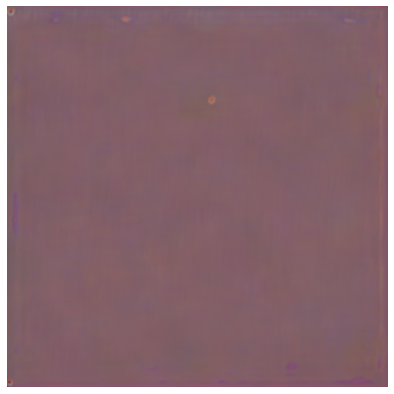

In [ ]:
## Encoding prompts and a few more things
normalize = torchvision.transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))

def encodeText(text):
  t = clip.tokenize(text).cuda()
  t = clipmodel.encode_text(t).detach().clone()
  return t

def createEncodings(include, exclude, extras):
  include_enc = []
  for text in include:
    include_enc.append(encodeText(text))
  exclude_enc = encodeText(exclude) if exclude != '' else 0
  extras_enc = encodeText(extras) if extras != '' else 0

  return include_enc, exclude_enc, extras_enc

augTransform = torch.nn.Sequential(
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomAffine(30, (.2, .2), fill = 0)
).cuda()

Params, optimizer = init_params()

with torch.no_grad():
  print(Params().shape)
  img = norm_data(generator(Params()).cpu()) # 1 x 3 x 224 x 400 [225 x 400]
  print("img dimensions: ", img.shape)
  show_from_tensor(img[0])


In [ ]:
## create crops
# give variation of the image instead of just 1
def create_crops(img, num_crops=32):
  p = size1//2 # padding
  img = torch.nn.functional.pad(img, (p, p, p, p), mode = 'constant', value=0) # 1 x 3 x 448 x 624 (adding 112 * 2 on all sides to 224x400)

  img = augTransform(img) # RandomHorizontalFLip and RandomAffine

  crop_set = []
  for ch in range(num_crops):
    gap1 = int(torch.normal(1.2, .3, ()).clip(.43, 1.9) * size1)
    offsetx = torch.randint(0, int(size1*2 - gap1), ())
    offsety = torch.randint(0, int(size1*2 - gap1), ())

    crop = img[:, :, offsetx:offsetx+gap1, offsety:offsety+gap1]

    crop = torch.nn.functional.interpolate(crop, (224, 224), mode='bilinear', align_corners=True)
    crop_set.append(crop)

  img_crops = torch.cat(crop_set, 0) ## 32 x 3 x 224 x 224
  
  randnormal = torch.randn_like(img_crops, requires_grad=False)
  num_rands = 2
  randstotal = torch.rand((img_crops.shape[0],1,1,1)).cuda() # 32

  for ns in range(num_rands):
    randstotal *= torch.rand((img_crops.shape[0], 1, 1, 1)).cuda()

  img_crops = img_crops + noise_factor*randstotal*randnormal

  return img_crops

In [ ]:
# show current state of generation
def showme(Params, show_crop):
  with torch.no_grad():
    generated = generator(Params())

    if (show_crop):
      print("Augmented cropped example")
      aug_gen = generated.float() # 1 x 3 x 224 x 400
      aug_gen = create_crops(aug_gen, num_crops=1)
      aug_gen_norm = norm_data(aug_gen[0])
      show_from_tensor(aug_gen_norm)

    print("Generation")
    latest_gen = norm_data(generated.cpu()) # 1 x 3 x 224 x 400
    show_from_tensor(latest_gen[0])

  return (latest_gen[0])

In [ ]:
# optimization process
def optimize_result(Params, prompt):
  alpha = 1 ## the importance of the include encodings
  beta = .5 ## the importance of the exclude encodings

  ## image encoding
  out = generator(Params())
  out = norm_data(out)
  out = create_crops(out)
  out = normalize(out) # 30 x 3 x 224 x 224
  image_enc = clipmodel.encode_image(out) # 30 x 512

  ## text encoding  --  w1 and w2
  final_enc = w1 * prompt + w2 * extras_enc # prompt and extra_enc: 1 x 512
  final_text_include_enc = final_enc / final_enc.norm(dim=-1, keepdim=True) # 1 x 512
  final_text_exclude_enc = exclude_enc

  # calculate the loss
  main_loss = torch.cosine_similarity(final_text_include_enc, image_enc, -1) # 30
  penalize_loss = torch.cosine_similarity(final_text_exclude_enc, image_enc, -1) # 30

  final_loss = -alpha * main_loss + beta * penalize_loss
  
  return final_loss

def optimize(Params, optimizer, prompt):
  loss = optimize_result(Params, prompt).mean()
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()

  return loss

In [ ]:
# define training loop
def training_loop(Params, optimizer, show_crop=False):
  res_img=[]
  res_z=[]

  for prompt in include_enc:
    iteration = 0
    Params, optimizer = init_params() # 1 x 256 x 14 x 25 (255/16, 400/16) -> because of patches

    for it in range(total_iter):
      loss = optimize(Params, optimizer, prompt)

      if iteration >= 80 and iteration % 10 == 0:
        new_img = showme(Params, show_crop)
        res_img.append(new_img)
        res_z.append(Params()) # 1 x 256 x 14 x 25
        print("loss: ", loss.item(), "\niteration: ", iteration)

      iteration += 1
    torch.cuda.empty_cache()
  return res_img, res_z

Augmented cropped example


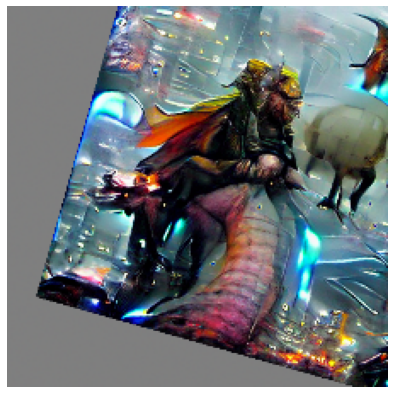

Generation


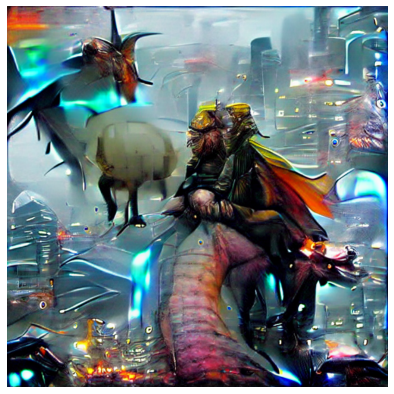

loss:  -0.322509765625 
iteration:  80
Augmented cropped example


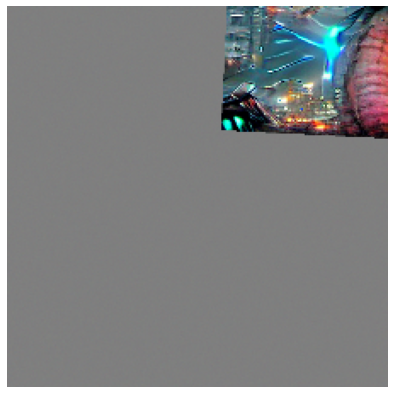

Generation


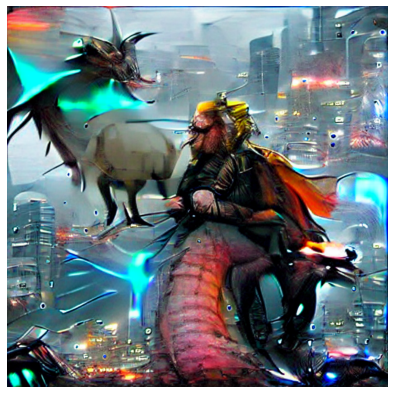

loss:  -0.324951171875 
iteration:  90
Augmented cropped example


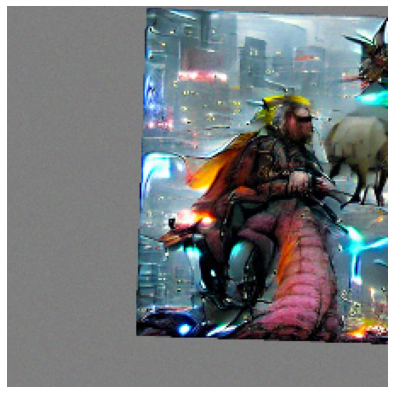

Generation


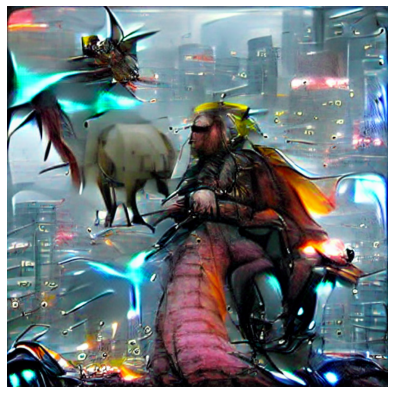

loss:  -0.346435546875 
iteration:  100
Augmented cropped example


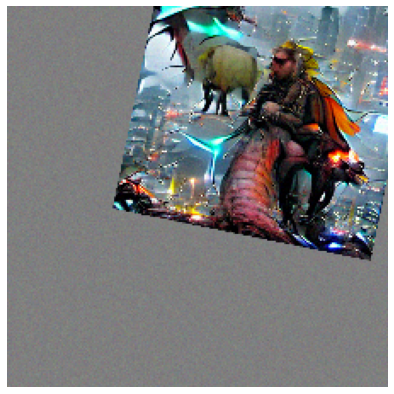

Generation


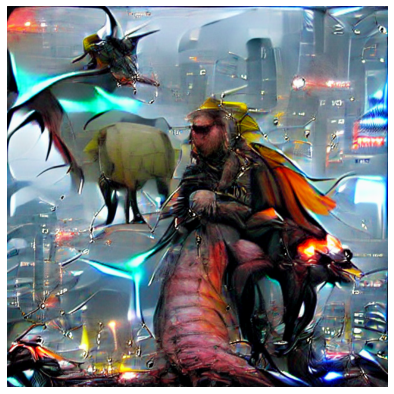

loss:  -0.325439453125 
iteration:  110
Augmented cropped example


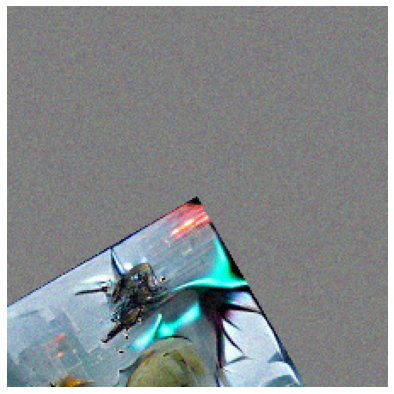

Generation


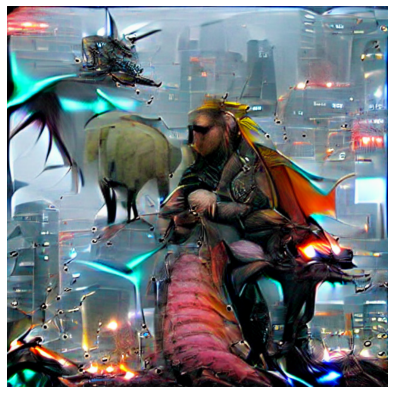

loss:  -0.335693359375 
iteration:  120
Augmented cropped example


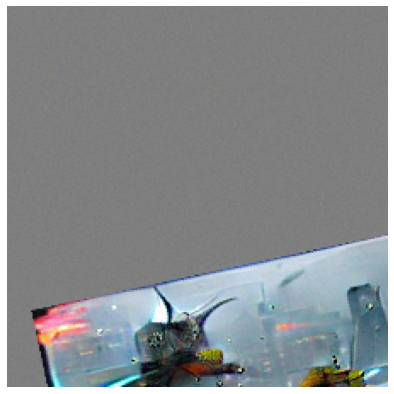

Generation


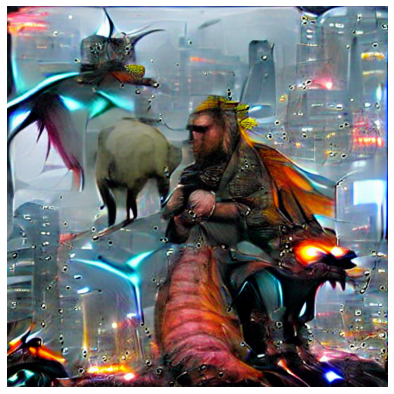

loss:  -0.340087890625 
iteration:  130
Augmented cropped example


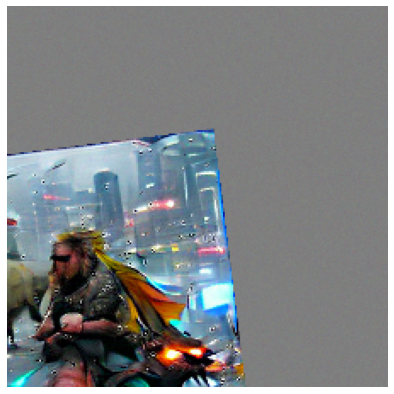

Generation


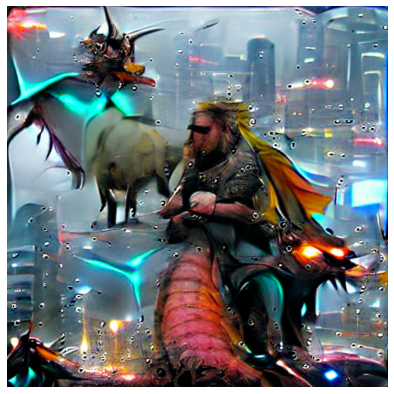

loss:  -0.298583984375 
iteration:  140
Augmented cropped example


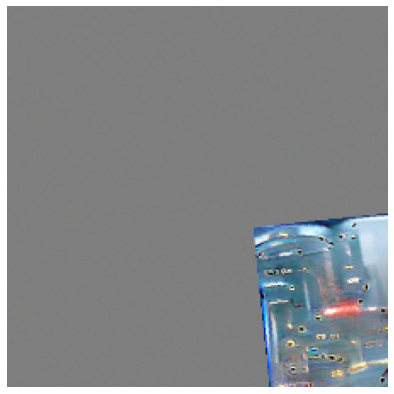

Generation


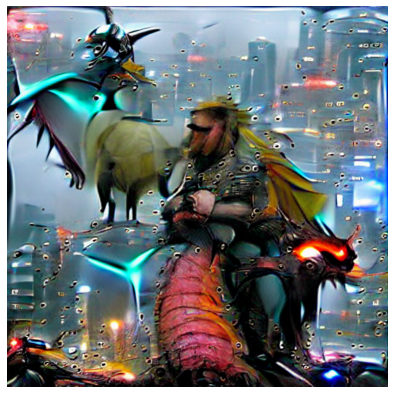

loss:  -0.316162109375 
iteration:  150
Augmented cropped example


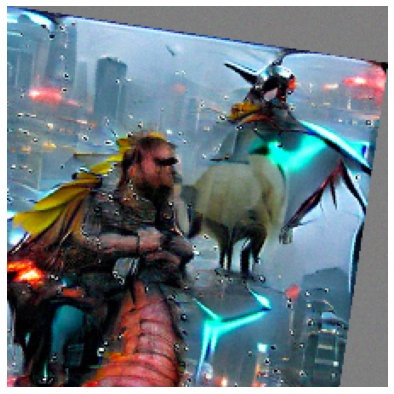

Generation


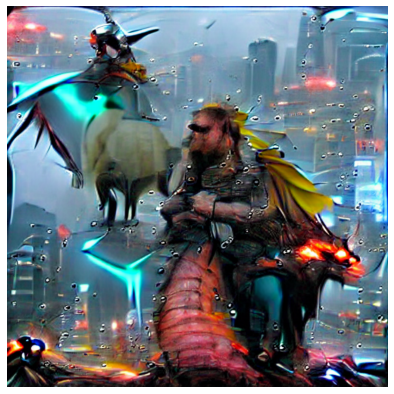

loss:  -0.302734375 
iteration:  160
Augmented cropped example


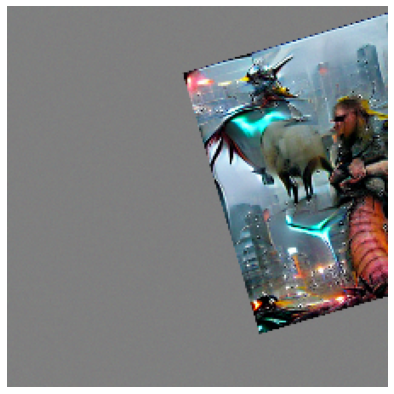

Generation


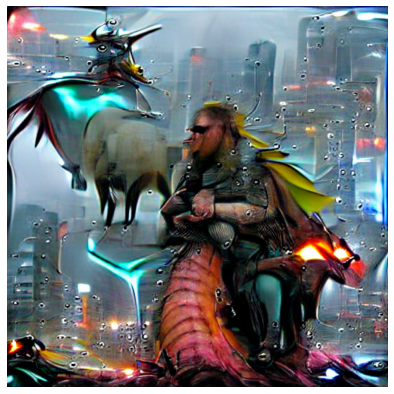

loss:  -0.35986328125 
iteration:  170
Augmented cropped example


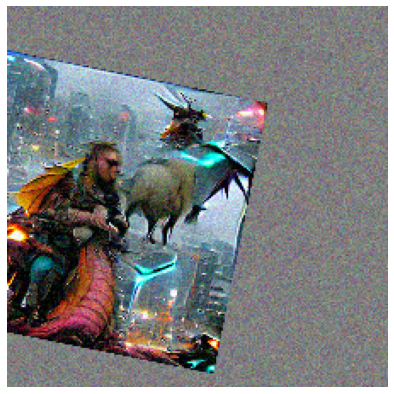

Generation


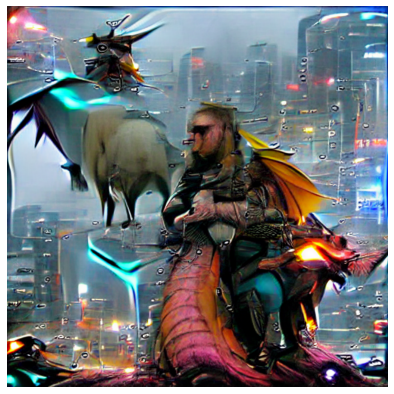

loss:  -0.3515625 
iteration:  180
Augmented cropped example


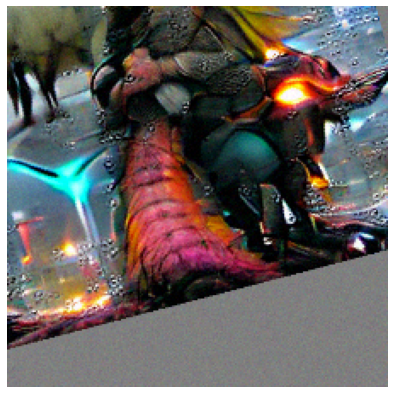

Generation


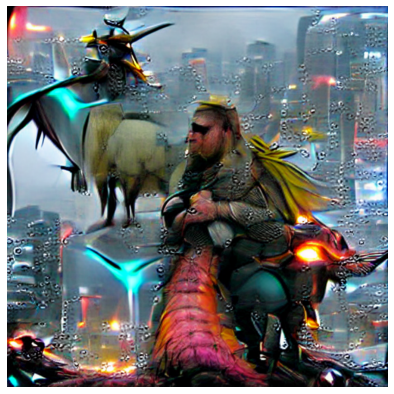

loss:  -0.318115234375 
iteration:  190
Augmented cropped example


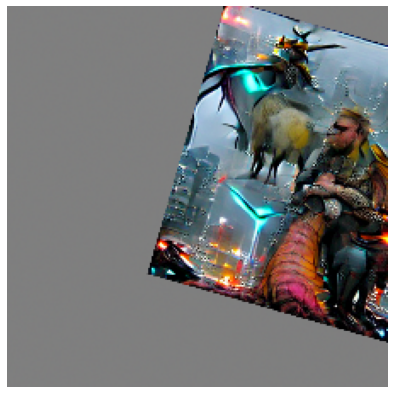

Generation


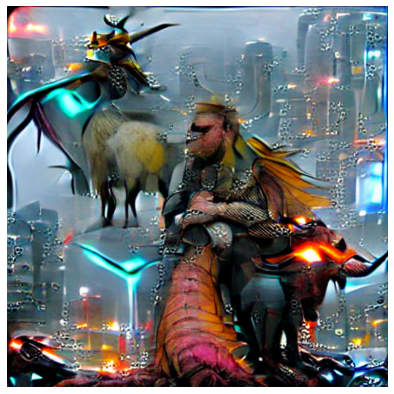

loss:  -0.330322265625 
iteration:  200
Augmented cropped example


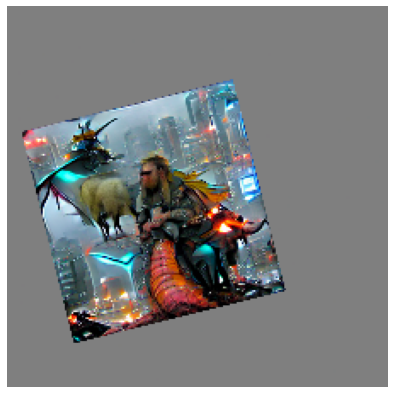

Generation


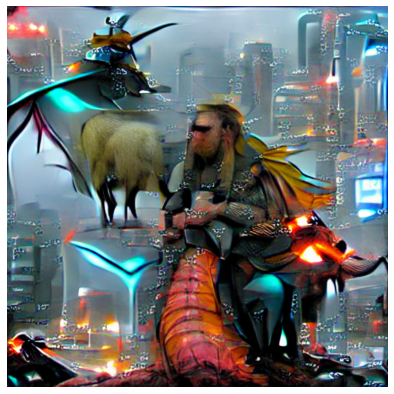

loss:  -0.309326171875 
iteration:  210
Augmented cropped example


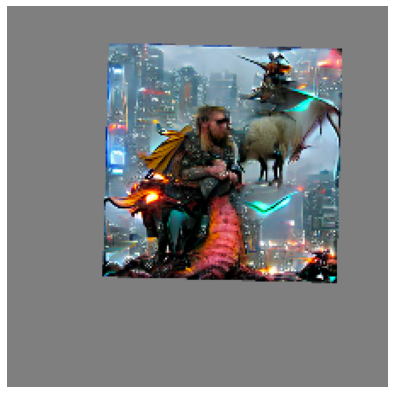

Generation


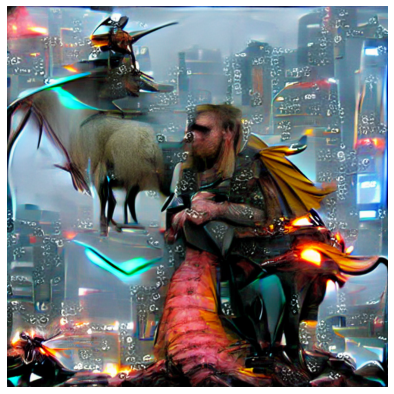

loss:  -0.35205078125 
iteration:  220
Augmented cropped example


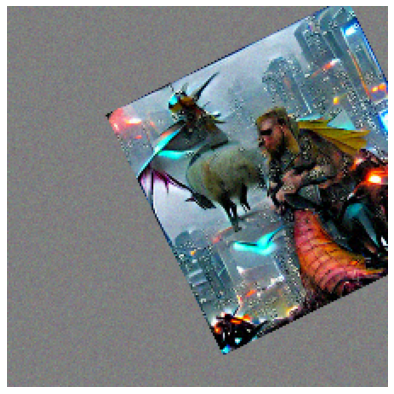

Generation


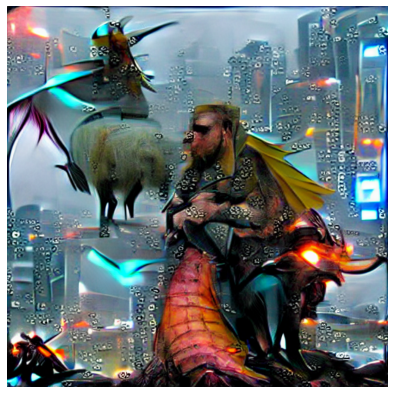

loss:  -0.317138671875 
iteration:  230
Augmented cropped example


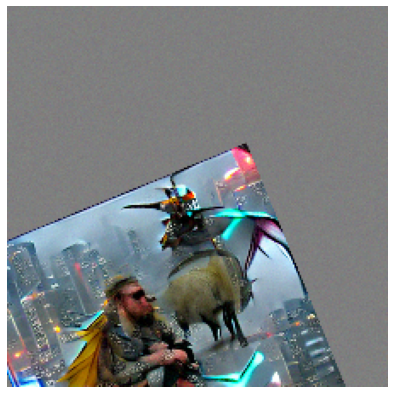

Generation


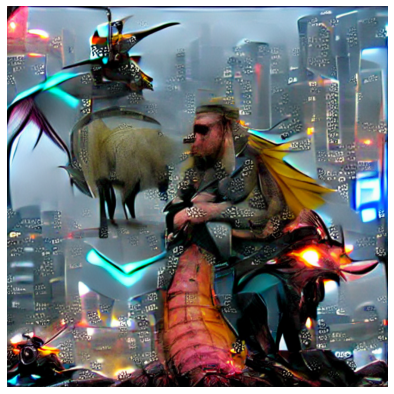

loss:  -0.299560546875 
iteration:  240
Augmented cropped example


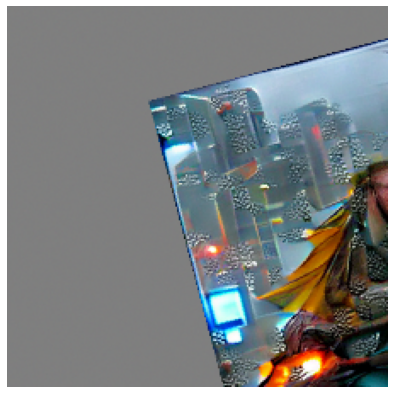

Generation


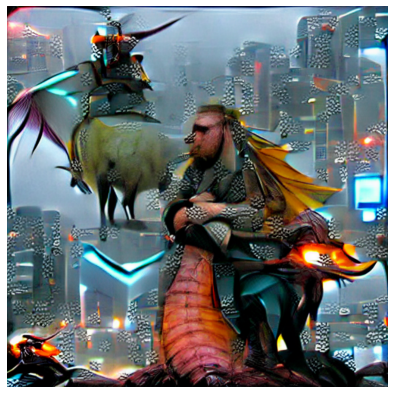

loss:  -0.290771484375 
iteration:  250


KeyboardInterrupt: ignored

In [ ]:
torch.cuda.empty_cache()
include=['Viking riding a dragon in a surreal futuristic landscape cyberpunk, future', 'transhumanistic photo of a humanoid robot with cybernetic implants brain machine interface surrealism', 'space travel outerspace extraterrestrial life aliens intergalactic space, futuristic, science fiction, art-print']
#include=['cute psychedelic avocado smiling']
exclude='watermark'
extras = ''
w1=1
w2=1
noise_factor=.22
total_iter=400

include_enc, exclude_enc, extras_enc = createEncodings(include, exclude, extras)
res_img, res_z = training_loop(Params, optimizer, show_crop=True)


In [ ]:
import gc
gc.collect()

14655

In [ ]:
print(len(res_img), len(res_z))
print(res_img[0].shape, res_z[0].shape)
print(res_z[0].max(), res_z[0].min())

3 3
torch.Size([3, 224, 400]) torch.Size([1, 256, 14, 25])
tensor(6.0246, device='cuda:0', grad_fn=<MaxBackward1>) tensor(-5.9439, device='cuda:0', grad_fn=<MinBackward1>)


In [ ]:
def interpolate(res_z_list, duration_list):
  gen_img_list=[]
  fps = 25

  for idx, (z, duration) in enumerate(zip(res_z_list, duration_list)):
    num_steps = int(duration*fps)
    z1=z
    z2=res_z_list[(idx+1)%len(res_z_list)] # 1 x 256 x 14 x 25 (225/16, 400/16)

    for step in range(num_steps):
      alpha = math.sin(1.5*step/num_steps)**6
      z_new = alpha * z2 + (1-alpha) * z1

      new_gen=norm_data(generator(z_new).cpu())[0] ## 3 x 224 x 400
      new_img=T.ToPILImage(mode='RGB')(new_gen)
      gen_img_list.append(new_img)

  return gen_img_list

durations=[5,5,5,5,5,5]
interp_result_img_list = interpolate(res_z, durations)

In [ ]:
!pip install imageio-ffmpeg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.9 MB 722 kB/s 


In [ ]:
## create a video
out_video_path=f"../video.mp4"
writer = imageio.get_writer(out_video_path, fps=25)
for pil_img in interp_result_img_list:
  img = np.array(pil_img, dtype=np.uint8)
  writer.append_data(img)

writer.close()

In [ ]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('../video.mp4','rb').read()
data="data:video/mp4;base64,"+b64encode(mp4).decode()
HTML("""<video width=800 controls><source src="%s" type="video/mp4"></video>""" % data)